In [1]:
# standard library imports
from __future__ import absolute_import, division, print_function
import os
import sys
import argparse
import gc

# standard numerical library imports
import math
import numpy as np
import scipy as sp
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
from matplotlib import rc
import mplhep as hep

import tensorflow as tf
from tensorflow import keras

import keras.backend as K
from tensorflow.keras.layers import Lambda, Dense, Input, Layer, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, LambdaCallback
from tensorflow.keras.initializers import Constant
from tensorflow.keras.backend import concatenate

# energyflow imports
import energyflow as ef
from energyflow.archs import PFN
from energyflow.utils import data_split, remap_pids, to_categorical



In [2]:
sys.path.append('../')
import DCTR


Madgraph was not found in PATH or in docker /tf/madgraph/MG5_aMC_v2_9_16 dir 
 can be added temporarily with sys.path.append('path/to/madgraph')


In [3]:
data_dir = '../../Data'
# NAF
# data_dir = '/nfs/dust/cms/user/puschman/pythia8307/examples/output'


In [4]:
X0 = []

for i in range(13, 14):
    dataset = np.load(f'{data_dir}/B-Fragmentation_Rb_1.056_v2/bootstrapping_Xb_multC_multNeutra_listBtop_listBextra-Rb_1.056_1M_seed{i}_CP5.npz')
    print(dataset.files)
    X0.extend(dataset['a'])

X0 = np.array(X0)
print(X0.shape)



['a', 'b', 'c', 'd', 'e']
(1992816,)


In [5]:
X1 = []

for i in range(13, 14):
    dataset = np.load(f'{data_dir}/B-Fragmentation_Rb_0.855_v2/bootstrapping_Xb_multC_multNeutra_listBtop_listBextra-Rb_0.855_1M_seed{i}_CP5.npz')
    print(dataset.files)
    X1.extend(dataset['a'])

X1 = np.array(X1)
print(X1.shape)


['a', 'b', 'c', 'd', 'e']
(1992706,)


In [6]:
print(X0.shape)
print(X1.shape)


(1992816,)
(1992706,)


In [7]:
X0_pari = []
X0_dispari = []
X1_pari = []
X1_dispari = []


for i, _ in enumerate(X0):
    if i % 2 == 0:
        X0_pari.append(X0[i])
    else:
        X0_dispari.append(X0[i])


for i, _ in enumerate(X1):
    if i % 2 == 0:
        X1_pari.append(X1[i])
    else:
        X1_dispari.append(X1[i])


In [8]:
print(len(X0_pari))
print(len(X1_pari))

996408
996353


In [9]:
print(len(X0_dispari))
print(len(X1_dispari))

996408
996353


In [10]:
X0_tot = []
for i, _ in enumerate(X0_pari):
    X0_tot.append([[X0_pari[i]], [X0_dispari[i]]])
    

In [11]:
X0_tot = np.array(X0_tot)
print(X0_tot.shape)


(996408, 2, 1)


In [12]:
X1_tot = []
for i, _ in enumerate(X1_pari):
    X1_tot.append([[X1_pari[i]], [X1_dispari[i]]])
    

In [13]:
X1_tot = np.array(X1_tot)
print(X1_tot.shape)


(996353, 2, 1)


In [14]:
# limit to same size
num_lim = 996298

X0_tot=X0_tot[:num_lim]
X1_tot=X1_tot[:num_lim]


In [15]:
print(X0_tot.shape)
print(X1_tot.shape)


(996298, 2, 1)
(996298, 2, 1)


In [137]:
model_dir = './saved_models'
model_list = []

for i in range(1, 51):
    model_list.append(f'{model_dir}/DCTR_pp_tt_1D_Rb_mine_xB_CP5_nominal_1M_v2_iter_{i:02d}.h5')

# print(*model_list, sep='\n')


In [139]:
# calculating reweights only needs to happen once, then we can read the results from disk
'''
Phi_sizes = (100,100,128)
F_sizes = (100,100,100)
input_dim=1

dctr = PFN(input_dim = input_dim,
           Phi_sizes = Phi_sizes, 
           F_sizes   = F_sizes,
           summary   = False)


wgts_list = []
for model in model_list:
    dctr.load_weights(model)
    preds_1 = dctr.predict(X1_tot, batch_size=1000)
    weights_1 = np.ones(len(X1_tot))
    np.divide(preds_1[:,0], preds_1[:,1], out = weights_1, where=preds_1[:,1]!=0.0)

    wgts_list.append(weights_1)

wgts_list = np.array(wgts_list)

np.save(f'{data_dir}/B-Fragmentation_Rb_0.855_v2/wgts_list_1M_50iter.npy', wgts_list)
'''

wgts_list = np.load(f'{data_dir}/B-Fragmentation_Rb_0.855_v2/wgts_list_1M_50iter.npy')

print(wgts_list.shape)
print(wgts_list)



(50, 996298)
[[1.303 1.064 0.667 ... 0.846 0.949 1.257]
 [1.272 1.081 0.642 ... 0.838 0.942 1.255]
 [1.292 1.098 0.649 ... 0.838 0.912 1.251]
 ...
 [1.309 1.084 0.656 ... 0.821 0.933 1.274]
 [1.262 1.096 0.652 ... 0.829 0.953 1.254]
 [1.299 1.071 0.673 ... 0.833 0.958 1.284]]


In [140]:
wgts_mean_per_event = np.mean(wgts_list, axis = 0)
print(np.shape(wgts_mean_per_event))


(996298,)


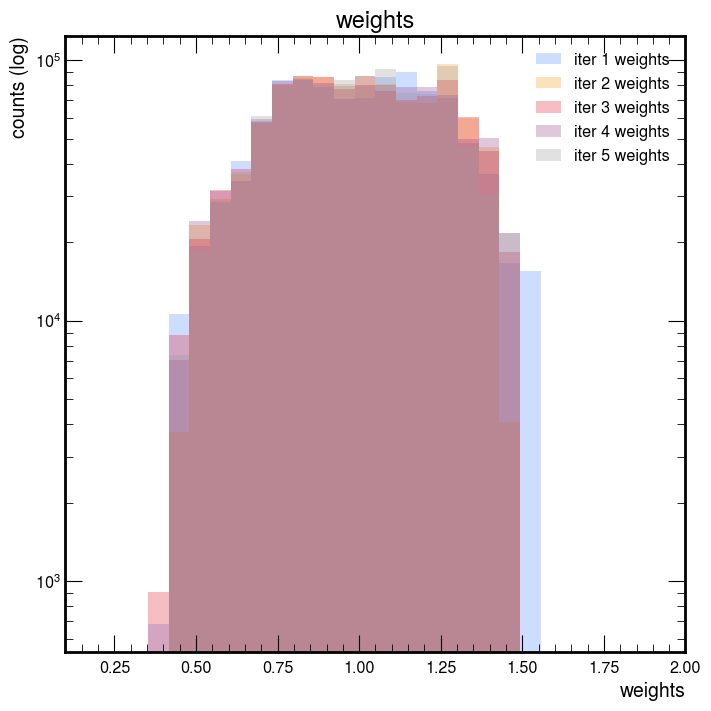

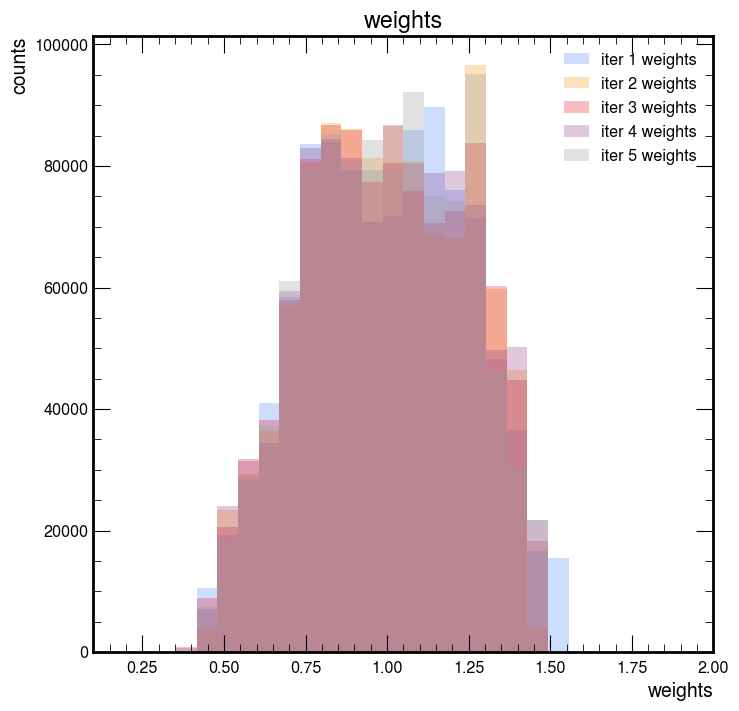

In [19]:
# plot and check dctr rwgt
font = {'size'   : 14}
rc('font', **font)

wgts_args = []
for i, _ in enumerate(wgts_list):
    if i >= 5:
        continue
    wgts_args.append([wgts_list[i], rf'iter {i + 1} weights'])
    
# wgts_args.append([wgts_mean_per_event, rf'mean weights']) # mean wgt per event

# y log scale
DCTR.plot_weights(wgts_args, start = 0.1, stop = 2, xscale='lin') # log x
# DCTR.plot_weights(wgts_args, start = 0, stop = 5, xscale='lin') # linear x

# y lin scale
DCTR.plot_weights(wgts_args, start = 0.1, stop = 2, xscale='lin', yscale='lin') # log x
# DCTR.plot_weights(wgts_args, start = 0, stop = 5, xscale='lin', yscale='lin') # linear x


In [141]:
# check weights

# when building ratio of square root of squared weights, the value we are comparing against has wgt = 1 for all events 
# -> /sqrt(num_events) is all we need

def get_wgts_stats(wgts_list):
    min_wgt_list    = []
    max_wgt_list    = []
    mean_wgt_list   = []
    ratio_wgts_list = []
    sqrt_num_events = math.sqrt(len(wgts_list[0]))
    for i, wgts in enumerate(wgts_list):
        min_wgt_list.append(np.min(wgts))
        max_wgt_list.append(np.max(wgts))
        mean_wgt_list.append(np.mean(wgts))
        
        sqrt_sum_wgts_squared = math.sqrt(np.sum(np.power(wgts, 2)))
        ratio_wgts_list.append(sqrt_num_events/sqrt_sum_wgts_squared)

    return np.array(min_wgt_list), np.array(max_wgt_list), np.array(mean_wgt_list), np.array(ratio_wgts_list)


In [142]:
min_wgt_list, max_wgt_list, mean_wgt_list, ratio_wgt_list = get_wgts_stats(wgts_list)
np.set_printoptions(precision=5, suppress=True)

print(f'{min_wgt_list   = }\n')
print(f'{max_wgt_list   = }\n')
print(f'{mean_wgt_list  = }\n')
print(f'{ratio_wgt_list = }\n')

mean_mean_wgt = np.mean(mean_wgt_list)
std_mean_wgt  = np.std(mean_wgt_list)

mean_ratio_wgt = np.mean(ratio_wgt_list)
std_ratio_wgt  = np.std(ratio_wgt_list)

print(f'mean weights:\n\
{mean_mean_wgt:.5f} +/- {std_mean_wgt:.5f}\n')

print(f'ratio of sqrt of sum of squared weights:\n\
{mean_ratio_wgt:.5f} +/- {std_ratio_wgt:.5f}')


min_wgt_list   = array([0.38523, 0.37242, 0.43703, 0.44914, 0.40599, 0.40983, 0.39669,
       0.3917 , 0.4219 , 0.43824, 0.4131 , 0.40781, 0.39576, 0.40798,
       0.40384, 0.35788, 0.37448, 0.38235, 0.37916, 0.40636, 0.41678,
       0.37385, 0.41274, 0.44365, 0.45831, 0.4234 , 0.42775, 0.41729,
       0.40318, 0.39195, 0.45484, 0.47671, 0.37179, 0.37719, 0.43172,
       0.41781, 0.42277, 0.39567, 0.39843, 0.39377, 0.37456, 0.39825,
       0.437  , 0.42923, 0.41132, 0.44431, 0.40212, 0.42284, 0.39745,
       0.45524])

max_wgt_list   = array([1.48905, 1.47776, 1.46626, 1.42567, 1.47781, 1.48462, 1.47741,
       1.49209, 1.43177, 1.4626 , 1.4724 , 1.49367, 1.49239, 1.44995,
       1.4652 , 1.51097, 1.48649, 1.52298, 1.48779, 1.47774, 1.50581,
       1.48197, 1.42548, 1.45553, 1.4833 , 1.45768, 1.46035, 1.47049,
       1.47991, 1.45542, 1.47623, 1.50416, 1.45375, 1.45916, 1.46566,
       1.44219, 1.44133, 1.49118, 1.48591, 1.47376, 1.47374, 1.47937,
       1.45818, 1.52443, 1.39584, 1.46

In [23]:
# covariance calculations

In [143]:
# covariance matrix using weighted samples
def weighted_cov(data, weights):
    # print(f'{np.shape(data) = }')

    # Calculate weighted mean
    weighted_mean = np.average(data, axis=0, weights=weights)
    # print(f'{np.shape(weighted_mean) = }')
    # print(f'{weighted_mean = }')

    # Calculate centered data
    centered_data = data - weighted_mean
    # print(f'{np.shape(centered_data) = }')

    # Calculate weighted covariance matrix
    vars = len(data[0,:]) # num of variables per sample
    weighted_covariance = np.zeros(shape=(vars, vars))
    for i in range(vars):
        for j in range(vars):
            weighted_covariance[i, j] = np.sum(
                weights * centered_data[:,i] * centered_data[:,j]) / np.sum(weights)

    return weighted_covariance
    

# correlation matrix using weighted samples
def weighted_corr(data, weights):
    cov = weighted_cov(data, weights)

    # Calculate diagonal matrix for standard deviations
    std_dev = np.sqrt(np.diag(cov))
    std_dev_matrix = np.outer(std_dev, std_dev)

    # Calculate correlation matrix
    weighted_correlation = cov / std_dev_matrix

    return weighted_correlation
    


In [144]:
import matplotlib.patheffects as pe

def plot_matrix(matrix, title, variable_labels = None, vmin=None, vmax=None, savefig = './plots/up/matrix.pdf'):
    font = {'size'   : 14}
    rc('font', **font)

    assert len(matrix[0,:]) == len(matrix[:,0]), 'matrix is not square'
    
    if variable_labels is not None:
        assert len(variable_labels) == len(matrix[0, :]), 'length of variable_labels does not match the dimension of the square matrix'
    else:
        variable_labels = np.arange(1, len(matrix) + 1) # Labels for variables is bin number
    
    figsize = (max(8, (matrix.shape[1]+1)*0.9), max(7, matrix.shape[0])*0.9)
    plt.figure(figsize=figsize)
    
    if vmin is not None and vmax is not None:
        plt.matshow(matrix, cmap='viridis', vmin=vmin, vmax=vmax, fignum=1, aspect='auto')  # Set colormap limits if specified
    else:
        plt.matshow(matrix, cmap='viridis', fignum=1, aspect='auto')  # Default behavior with automatic colormap limits

    plt.colorbar()  # Add colorbar to show scale
    plt.title(title)  # Set the title of the plot
    
    # Add annotations to show values in the heatmap
    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            plt.text(j, i, f'{matrix[i, j]:.3f}', ha='center', va='center', color='black',  path_effects=[pe.withStroke(linewidth=2, foreground="white")])

    # Label x-axis with variable names
    plt.xticks(ticks=np.arange(len(variable_labels)), labels=variable_labels)
    plt.xlabel('bin number')  # Label x-axis

    # Label y-axis with variable names
    plt.yticks(ticks=np.arange(len(variable_labels)), labels=variable_labels)
    plt.ylabel('bin number')  # Label y-axis

    plt.savefig(savefig)
    plt.show()



In [145]:
# plotting settings
# Global plot settings
from matplotlib import rc
import matplotlib.font_manager
import mplhep as hep
plt.style.use(hep.style.CMS)

pythia_text = r'$PYTHIA \; pp \to  t\bar{t}$'
hep_text = 'Simulation Preliminary'

from matplotlib.lines import Line2D

def make_legend(ax, title, loc='best', font_size = 20):
    leg = ax.legend(frameon=False, loc=loc)
    leg.set_title(title, prop={"size": f'{int(font_size)}'})
    for i, _ in enumerate(leg.texts):
        leg.texts[i].set_fontsize(int(font_size))
    leg._legend_box.align = "left"
    plt.tight_layout()



target_color  = 'black'
rwgt_color    = '#e42536' # red
nominal_color = '#5790fc' # light blue

plt_style_10a = {'color':'#5790fc', 'linewidth':3, 'linestyle':'--'} #, 'density':True, 'histtype':'step'}
plt_style_11a = {'color':'black', 'linewidth':3, 'linestyle':'-'} #', 'density':True, 'histtype':'step'}
plt_style_12a = {'color':'#e42536', 'linewidth':3, 'linestyle':':'} #, 'density':True, 'histtype':'step'}
plt_style_13a = {'color':'blue', 'linewidth':3, 'linestyle':'--'} #, 'density':True, 'histtype':'step'}

target_plt_style  = plt_style_11a
rwgt_plt_style    = plt_style_12a
nominal_plt_style = plt_style_10a




In [146]:
def calc_hists_from_wgts_list(X, bins, wgts_list):
    hist_list = []
    uncert_nrm_list = []
    for i, wgt in enumerate(wgts_list):
        # main density hist
        hist, _ = np.histogram(X, weights = wgt, bins = bins, density=True)
        hist_list.append(hist)

        # non density hist (as in counts) for calculating uncert
        n   , _ = np.histogram(X, weights = wgt, bins = bins, density=False)

        # which bin did each event end up in
        bin_indices = np.digitize(X, bins = bins)

        # sqrt of sum of wgt**2 in each bin
        uncert = np.array([np.sqrt(np.sum(wgt[bin_indices == bin_index]**2)) for bin_index in range(1, len(bins))])
        uncert_nrm = np.divide(uncert, n, out=np.ones_like(uncert), where=(n != 0)) # normalizing uncert by dividing by bin counts, for non-zero bin counts

        uncert_nrm_list.append(uncert_nrm)
    
    return np.array(hist_list), np.array(uncert_nrm_list)


In [147]:

def plot_bootstrapping_from_hists(in_hists, ratio_ylim, obs = r'x_{b}', part = r't\bar{t}', unit = '', inv_unit = '', save_folder = './plots', save_prefix = 'plot', legend_loc = 'best'):
    [
        [hist_list, bins],
        [target_hist,  target_uncert ], 
        [nominal_hist, nominal_uncert],
        [mean_hist,    mean_uncert, std_hist]
    ] = in_hists

    # Create figure with two subplots
    fig, axes = plt.subplots(nrows=2, figsize=(8,10), gridspec_kw={'height_ratios': [2, 1]})
    fig.tight_layout(pad=1)

    # First subplot
    bin_centers = (bins[:-1] + bins[1:]) / 2.0

    axes[0].step(bins, target_hist, label = r'$r_{b}=1.056$', where='post', **target_plt_style)
    axes[0].step(bins, nominal_hist, label = r'$r_{b}=0.855$', where='post', **nominal_plt_style)
    axes[0].step(bins, mean_hist, label = r'$r_{b}=0.855 \; wgt.$ (mean)', where='post', **rwgt_plt_style)

    # Calculate the ratios of histograms
    ratio_0 = target_hist / target_hist
    ratio_1 = mean_hist / target_hist
    ratio_std = std_hist / mean_hist
    ratio_2 = nominal_hist / target_hist

    make_legend(axes[0], pythia_text, loc=legend_loc)

    start = bins[0]
    stop = bins[-1]


    # Constructing the label using Python string formatting
    label = r'$1$/$\sigma \frac{d\sigma}{d %s(%s)}$ %s' % (obs, part, inv_unit)

    axes[0].set_ylabel(label)
    # axes[0].set_yscale('log')
    axes[0].grid(True)
    axes[0].legend()


    # Second subplot
    axes[1].plot([start, stop], [1,1], '-', color=target_color,  linewidth=3, label=r'$r_{b}=1.056$')
    for hist in hist_list:
        axes[1].plot(bin_centers, hist/target_hist[:-1], linewidth=1, alpha = 0.3, color = 'grey')
    axes[1].plot(bin_centers, ratio_2[:-1], label=r'$r_{b}=0.855$', **nominal_plt_style)
    axes[1].plot(bin_centers, ratio_1[:-1], label = r'$r_{b}=0.855 \; wgt.$ (mean)', **rwgt_plt_style)
    axes[1].fill_between(bin_centers, (ratio_1*(1+ratio_std))[:-1], (ratio_1*(1-ratio_std))[:-1], color=rwgt_color, alpha = 0.5, label = r'$r_{b}=0.855 \; wgt.$ (std)') 

    axes[1].errorbar(bin_centers, ratio_0[:-1], yerr=target_uncert[:-1], fmt='-', color=target_color)
    axes[1].errorbar(bin_centers, ratio_1[:-1], yerr=mean_uncert[:-1], fmt='--', color=rwgt_color)
    axes[1].errorbar(bin_centers, ratio_2[:-1], yerr=nominal_uncert[:-1], fmt=':', color=nominal_color)


    axes[1].set_xlabel(fr'${obs}({part}){unit}$')
    axes[1].set_ylabel(f'Ratio')
    axes[1].grid(True)


    # print(f'uncertainty NLO: {uncert_nrm_list[0]}')
    plt.subplots_adjust(hspace=0.2)
    plt.subplots_adjust(left=0.2, right=0.95, bottom=0.1, top=0.95)
    axes[1].set_ylim(ratio_ylim)

    axes[0].set_xlim([start,stop])
    axes[1].set_xlim([start,stop])
    axes[1].legend(fontsize=13)

    #hep.cms.label(ax=axes[0], data=False, paper=False, lumi=None, fontsize=20, loc=0)
    hep.cms.text(hep_text, loc=0, fontsize=20, ax=axes[0])
    axes[0].text(1.0, 1.05, '(13 TeV)', ha="right", va="top", fontsize=20, transform=axes[0].transAxes)

    # adjust strings for named files
    obs = obs.replace('\\', '').replace('{', '').replace('}', '').replace('_','').replace(' ','-').lower()
    part = part.replace('\\', '').replace('{', '').replace('}', '').replace('bar', '').replace(' ','').lower()

    os.makedirs(save_folder, exist_ok=True)
    plt.savefig(f'{save_folder}/{save_prefix}_{part}_{obs}_hist.pdf')

    plt.show()



In [ ]:
# CAUTION !!

# X0 is target
# X1 is nominal

# Opposite to MiNNLO reweighting


In [149]:
# 11 bin Xb
'''
bins = np.linspace(0,1.1,12)

# calculate hist for each model (wgt in wgts_list)
hist_list, uncert_nrm_list = calc_hists_from_wgts_list(X1_tot[:,0,0], bins, wgts_list)

# get mean and std
mean_hist = np.mean(hist_list, axis = 0)
std_hist = np.std(hist_list, axis = 0)
# for uncertainty, only interested in mean per bin
mean_uncert = np.mean(uncert_nrm_list, axis = 0)


# calc other histograms to compare to
wgt_uni = np.ones_like(X1_tot[:,0,0]) # need uniform wgts

[target_hist] , [target_uncert]  = calc_hists_from_wgts_list(X0_tot[:,0,0], bins, [wgt_uni])
[nominal_hist], [nominal_uncert] = calc_hists_from_wgts_list(X1_tot[:,0,0], bins, [wgt_uni])


# add last value to hist for plotting reasonscenter_mass_energy = '(13 TeV)'
target_hist     = np.concatenate((target_hist   , [target_hist[-1]]))
target_uncert   = np.concatenate((target_uncert , [target_uncert[-1]]))

nominal_hist    = np.concatenate((nominal_hist  , [nominal_hist[-1]]))
nominal_uncert  = np.concatenate((nominal_uncert, [nominal_uncert[-1]]))

mean_hist       = np.concatenate((mean_hist     , [mean_hist[-1]]))
mean_uncert     = np.concatenate((mean_uncert   , [mean_uncert[-1]]))
std_hist        = np.concatenate((std_hist      , [std_hist[-1]]))


# save all to disk for plotting macro
out_hists = [
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
]
out_hists = np.array(out_hists, dtype=object)
np.save('./plots/out_hists_Xb_11bins.npy', out_hists)
'''

# load previously calculated hists from disk
out_hists = np.load('./plots/out_hists_Xb_11bins.npy', allow_pickle=True)
[
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
] = out_hists


print('mean rwgt: hist, uncert, sdt')
print(mean_hist)
print(mean_uncert)
print(std_hist)

print('target: hist, uncert')
print(target_hist)
print(target_uncert)

print('nominal  : hist, uncert')
print(nominal_hist)
print(nominal_uncert)


mean rwgt: hist, uncert, sdt
[0.01211 0.14799 0.23691 0.33825 0.4939  0.75308 1.29606 2.31594 2.83385
 1.54759 0.02434 0.02434]
[0.02986 0.00855 0.00676 0.00569 0.00475 0.00391 0.00309 0.0023  0.00189
 0.00223 0.01739 0.01739]
[0.00016 0.00168 0.00218 0.00302 0.00414 0.00596 0.00912 0.01208 0.01406
 0.01019 0.00119 0.00119]
target: hist, uncert
[0.01287 0.14994 0.2376  0.34279 0.49546 0.75231 1.29582 2.31573 2.83343
 1.53809 0.02598 0.02598]
[0.02806 0.00822 0.00653 0.00544 0.00452 0.00367 0.0028  0.00209 0.00189
 0.00257 0.01975 0.01975]
nominal  : hist, uncert
[0.01171 0.14279 0.2283  0.32249 0.46175 0.68077 1.09538 1.97062 2.94487
 2.10642 0.0349  0.0349 ]
[0.02941 0.00842 0.00666 0.00561 0.00468 0.00386 0.00304 0.00227 0.00185
 0.00219 0.01704 0.01704]


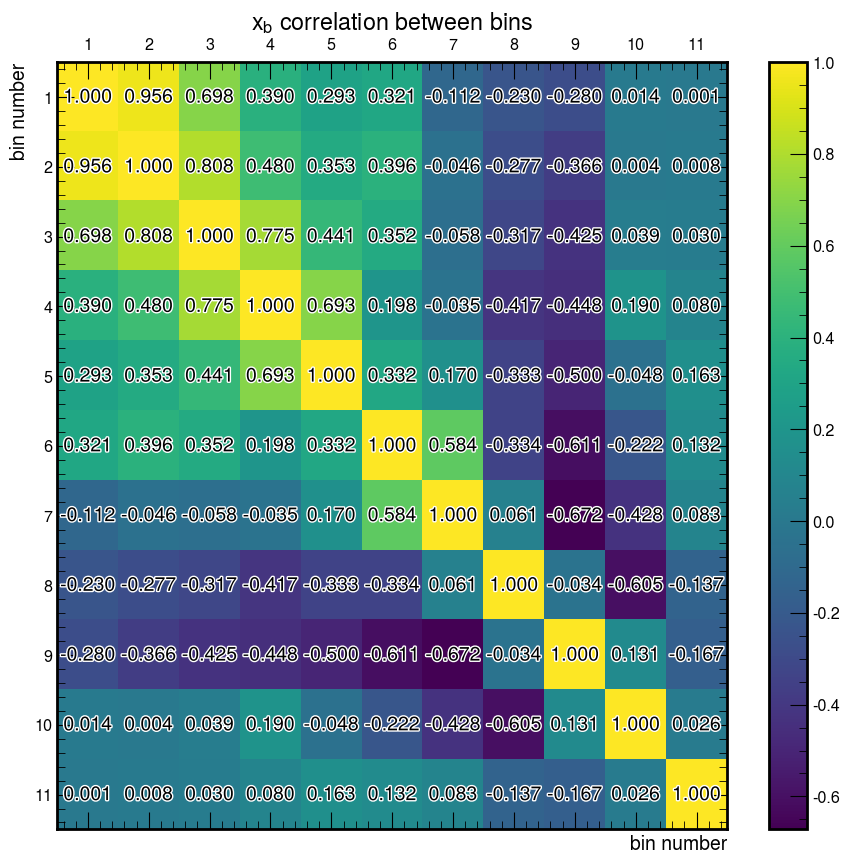

In [150]:
corr_matrix = weighted_corr(hist_list, weights = [1]*len(hist_list))

plot_matrix(corr_matrix, title = r'x$_b$ correlation between bins', savefig = './plots/xb_11bin_1M_50iter_corr_matrix.pdf')


/tmp/ipykernel_86812/2222998958.py:19: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


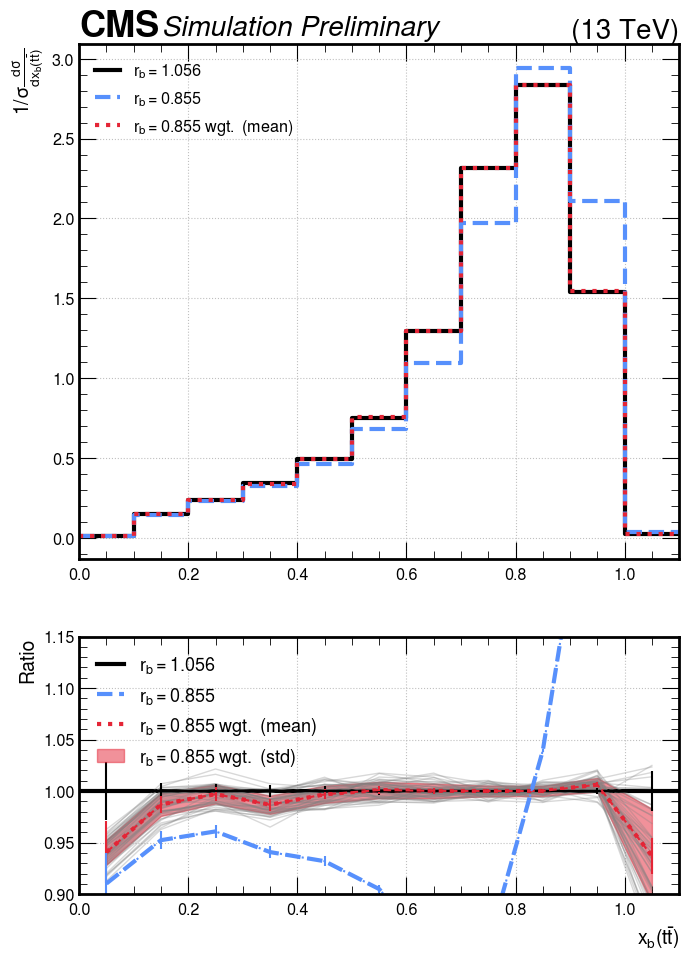

In [151]:
# plot the hists above

plot_bootstrapping_from_hists(out_hists, ratio_ylim=[0.9, 1.15], obs = r'x_{b}', part = r't\bar{t}', unit = '', inv_unit = '', save_folder = './plots', save_prefix = '11bins')



In [153]:
# original: 50 bin Xb
'''
bins = np.linspace(0,1.1,51)

# calculate hist for each model (wgt in wgts_list)
hist_list, uncert_nrm_list = calc_hists_from_wgts_list(X1_tot[:,0,0], bins, wgts_list)

# get mean and std
mean_hist = np.mean(hist_list, axis = 0)
std_hist = np.std(hist_list, axis = 0)
# for uncertainty, only interested in mean per bin
mean_uncert = np.mean(uncert_nrm_list, axis = 0)


# calc other histograms to compare to
wgt_uni = np.ones_like(X1_tot[:,0,0]) # need uniform wgts

[target_hist] , [target_uncert]  = calc_hists_from_wgts_list(X0_tot[:,0,0], bins, [wgt_uni])
[nominal_hist], [nominal_uncert] = calc_hists_from_wgts_list(X1_tot[:,0,0], bins, [wgt_uni])


# add last value to hist for plotting reasonscenter_mass_energy = '(13 TeV)'
target_hist     = np.concatenate((target_hist   , [target_hist[-1]]))
target_uncert   = np.concatenate((target_uncert , [target_uncert[-1]]))

nominal_hist    = np.concatenate((nominal_hist  , [nominal_hist[-1]]))
nominal_uncert  = np.concatenate((nominal_uncert, [nominal_uncert[-1]]))

mean_hist       = np.concatenate((mean_hist     , [mean_hist[-1]]))
mean_uncert     = np.concatenate((mean_uncert   , [mean_uncert[-1]]))
std_hist        = np.concatenate((std_hist      , [std_hist[-1]]))


# save all to disk for plotting macro
out_hists = [
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
]
out_hists = np.array(out_hists, dtype=object)
np.save('./plots/out_hists_Xb_50bins.npy', out_hists)
'''
# load previously calculated hists from disk
out_hists = np.load('./plots/out_hists_Xb_50bins.npy', allow_pickle=True)
[
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
] = out_hists


print('mean rwgt: hist, uncert, sdt')
print(mean_hist)
print(mean_uncert)
print(std_hist)

print('target: hist, uncert')
print(target_hist)
print(target_uncert)

print('nominal  : hist, uncert')
print(nominal_hist)
print(nominal_uncert)



mean rwgt: hist, uncert, sdt
[0.      0.00014 0.00021 0.01875 0.07977 0.11808 0.14333 0.16532 0.18449
 0.20201 0.21887 0.23887 0.26115 0.27695 0.29749 0.32897 0.35291 0.38183
 0.4202  0.44987 0.49852 0.53306 0.58219 0.63416 0.70459 0.78892 0.86803
 0.97884 1.11053 1.26025 1.45124 1.67942 1.8898  2.15673 2.44826 2.68475
 2.84979 2.95059 2.93469 2.81614 2.57056 2.26467 1.89621 1.48146 0.96647
 0.2578  0.02467 0.01378 0.01145 0.00777 0.00777]
[1.      0.58185 0.50103 0.05138 0.02485 0.02039 0.0185  0.01723 0.01632
 0.01559 0.01498 0.01434 0.01375 0.01334 0.01292 0.01227 0.01189 0.01144
 0.01093 0.01059 0.01008 0.00977 0.00937 0.00902 0.00859 0.00816 0.00783
 0.00742 0.00704 0.00666 0.00626 0.00585 0.00551 0.00515 0.00479 0.0045
 0.00427 0.00408 0.00397 0.00392 0.00397 0.00409 0.00431 0.00472 0.00567
 0.01083 0.03622 0.05175 0.05883 0.0733  0.0733 ]
[0.      0.      0.      0.00025 0.00101 0.00143 0.00166 0.00188 0.00201
 0.00208 0.00215 0.00226 0.00241 0.00249 0.00272 0.0031  0.00338 0.00

/tmp/ipykernel_86812/2852832631.py:34: RuntimeWarning: invalid value encountered in true_divide
  weighted_correlation = cov / std_dev_matrix


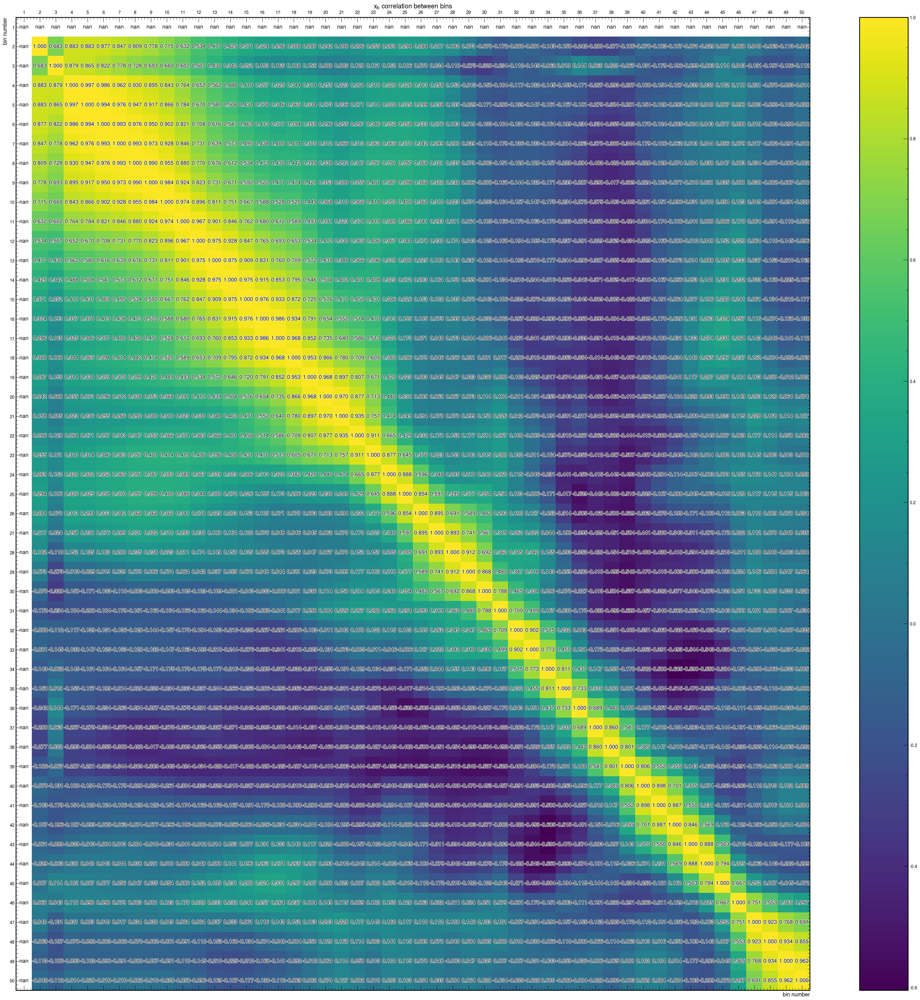

In [154]:
corr_matrix = weighted_corr(hist_list, weights = [1]*len(hist_list))

plot_matrix(corr_matrix, title = r'x$_b$ correlation between bins', savefig = './plots/xb_50bin_1M_50iter_corr_matrix.pdf')


/tmp/ipykernel_86812/3568123590.py:21: RuntimeWarning: invalid value encountered in true_divide
  ratio_0 = target_hist / target_hist
/tmp/ipykernel_86812/3568123590.py:22: RuntimeWarning: invalid value encountered in true_divide
  ratio_1 = mean_hist / target_hist
/tmp/ipykernel_86812/3568123590.py:23: RuntimeWarning: invalid value encountered in true_divide
  ratio_std = std_hist / mean_hist
/tmp/ipykernel_86812/3568123590.py:24: RuntimeWarning: invalid value encountered in true_divide
  ratio_2 = nominal_hist / target_hist
/tmp/ipykernel_86812/2222998958.py:19: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/tmp/ipykernel_86812/3568123590.py:44: RuntimeWarning: invalid value encountered in true_divide
  axes[1].plot(bin_centers, hist/target_hist[:-1], linewidth=1, alpha = 0.3, color = 'grey')


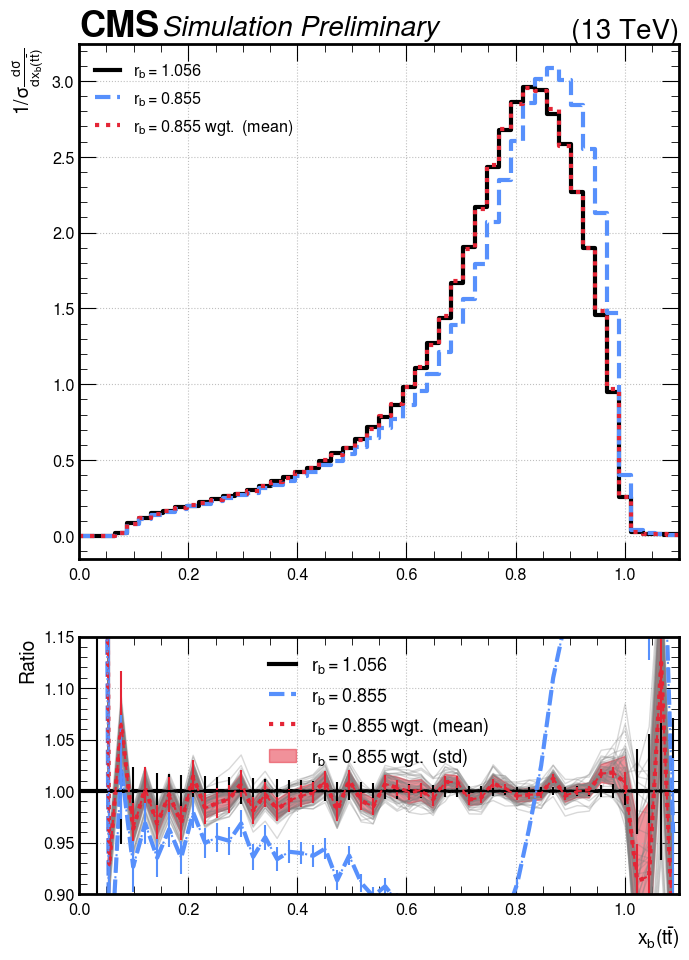

In [155]:
# plot the hists above

plot_bootstrapping_from_hists(out_hists, ratio_ylim=[0.9, 1.15], obs = r'x_{b}', part = r't\bar{t}', unit = '', inv_unit = '', save_folder = './plots', save_prefix = '50bins')



### B-Quark pT

In [104]:
pT = []
Rb_0855 = []

for i in range(13, 14):

    dataset = np.load(f'{data_dir}/B-Fragmentation_Rb_0.855_v2/bootstrapping_pT:bfirst_blast_abfirst_ablast_Bpos_Bneg_top_antitop-Rb_0.855_1M_seed{i}_CP5.npz')

    # print(dataset.files)
    p4_Bpos = dataset['e']
    p4_Bneg = dataset['f']
    pT_Bpos = p4_Bpos[:num_lim, 0]
    pT_Bneg = p4_Bneg[:num_lim, 0]
    # print(pT_Bpos.shape)
    # print(pT_Bneg.shape)
    pT_tot = np.concatenate((pT_Bpos,pT_Bneg))
    # print(pT_tot)
    Rb_0855.extend(pT_tot)

Rb_0855 = np.array(Rb_0855)
print(Rb_0855.shape)

print(Rb_0855[:10])


(1992596,)
[104.07   76.889  70.396  25.946 406.505  21.561  58.173  25.968  72.769
  26.693]


In [105]:
Rb_1056 = []

for i in range(13, 14):

    dataset = np.load(f'{data_dir}/B-Fragmentation_Rb_1.056_v2/bootstrapping_pT:bfirst_blast_abfirst_ablast_Bpos_Bneg_top_antitop-Rb_1.056_1M_seed{i}_CP5.npz')

    # print(dataset.files)
    p4_Bpos = dataset['e']
    p4_Bneg = dataset['f']
    pT_Bpos = p4_Bpos[:num_lim, 0]
    pT_Bneg = p4_Bneg[:num_lim, 0]
    # print(pT_Bpos.shape)
    # print(pT_Bneg.shape)
    pT_tot = np.concatenate((pT_Bpos,pT_Bneg))
    # print(pT_tot)
    Rb_1056.extend(pT_tot)

Rb_1056 = np.array(Rb_1056)
print(Rb_1056.shape)

print(Rb_1056[:10])


(1992596,)
[104.07   74.086 101.094  52.629  98.255  18.216  18.405  81.447  49.671
  39.747]


In [106]:
pT = [Rb_0855, Rb_1056]
pT = np.array(pT)

print(len(pT[0]))
print(len(pT[1]))

wgts_list_pT = []

for i, wgt in enumerate(wgts_list):
    wgts_pT = np.concatenate((wgt, wgt))
    wgts_list_pT.append(wgts_pT)

wgts_list_pT = np.array(wgts_list_pT)

print(wgts_list_pT.shape)


1992596
1992596
(50, 1992596)


In [157]:
# pT 10 bins
'''
bins = np.linspace(0,200,11)

# calculate hist for each model (wgt in wgts_list)
hist_list, uncert_nrm_list = calc_hists_from_wgts_list(pT[0], bins, wgts_list_pT)

# get mean and std
mean_hist = np.mean(hist_list, axis = 0)
std_hist = np.std(hist_list, axis = 0)
# for uncertainty, only interested in mean per bin
mean_uncert = np.mean(uncert_nrm_list, axis = 0)


# calc other histograms to compare to
wgt_uni = np.ones_like(pT[0]) # need uniform wgts

[target_hist] , [target_uncert]  = calc_hists_from_wgts_list(pT[1], bins, [wgt_uni])
[nominal_hist], [nominal_uncert] = calc_hists_from_wgts_list(pT[0], bins, [wgt_uni])


# add last value to hist for plotting reasonscenter_mass_energy = '(13 TeV)'
target_hist     = np.concatenate((target_hist   , [target_hist[-1]]))
target_uncert   = np.concatenate((target_uncert , [target_uncert[-1]]))

nominal_hist    = np.concatenate((nominal_hist  , [nominal_hist[-1]]))
nominal_uncert  = np.concatenate((nominal_uncert, [nominal_uncert[-1]]))

mean_hist       = np.concatenate((mean_hist     , [mean_hist[-1]]))
mean_uncert     = np.concatenate((mean_uncert   , [mean_uncert[-1]]))
std_hist        = np.concatenate((std_hist      , [std_hist[-1]]))


# save all to disk for plotting macro
out_hists = [
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
]
out_hists = np.array(out_hists, dtype=object)
np.save('./plots/out_hists_b_pt_10bins.npy', out_hists)
'''

# load previously calculated hists from disk
out_hists = np.load('./plots/out_hists_b_pt_10bins.npy', allow_pickle=True)
[
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
] = out_hists


print('mean rwgt: hist, uncert, sdt')
print(mean_hist)
print(mean_uncert)
print(std_hist)

print('target: hist, uncert')
print(target_hist)
print(target_uncert)

print('nominal  : hist, uncert')
print(nominal_hist)
print(nominal_uncert)


mean rwgt: hist, uncert, sdt
[0.00715 0.01376 0.0122  0.00782 0.00435 0.00231 0.00121 0.00064 0.00036
 0.0002  0.0002 ]
[0.00196 0.00141 0.00149 0.00183 0.00244 0.00331 0.00455 0.00621 0.00833
 0.01109 0.01109]
[0.00002 0.00001 0.00001 0.00001 0.00001 0.      0.      0.      0.
 0.      0.     ]
target: hist, uncert
[0.00717 0.0138  0.0122  0.00779 0.00435 0.00229 0.0012  0.00065 0.00035
 0.0002  0.0002 ]
[0.00188 0.00135 0.00144 0.0018  0.00241 0.00332 0.00459 0.00624 0.00845
 0.01115 0.01115]
nominal  : hist, uncert
[0.00689 0.01335 0.01215 0.008   0.00455 0.00246 0.00131 0.0007  0.00039
 0.00022 0.00022]
[0.00192 0.00138 0.00144 0.00178 0.00236 0.00321 0.0044  0.00601 0.00806
 0.01072 0.01072]


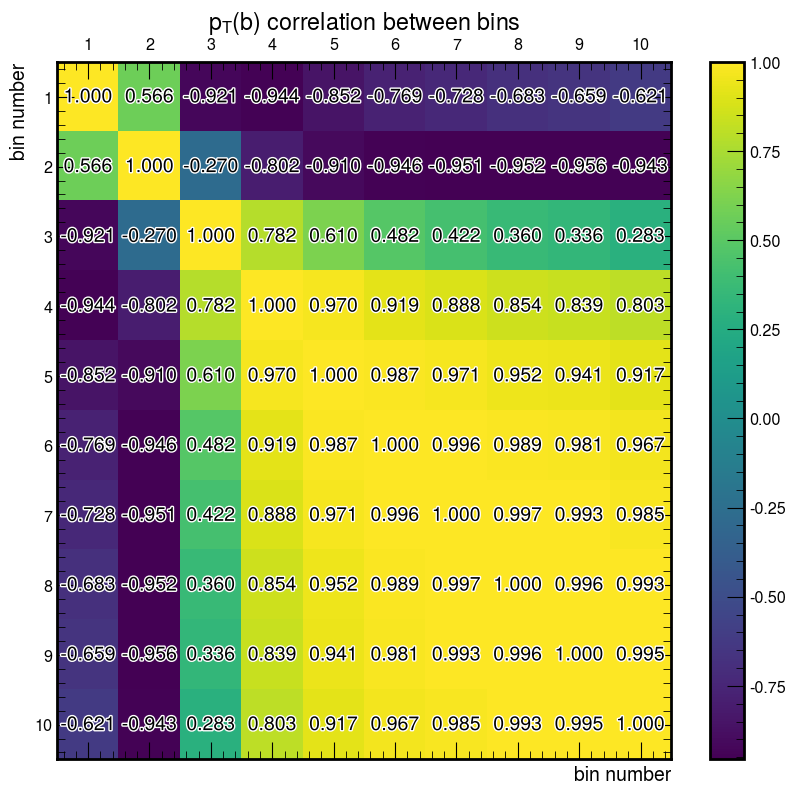

In [162]:
corr_matrix = weighted_corr(hist_list, weights = [1]*len(hist_list))

plot_matrix(corr_matrix, title = r'p$_T$(b) correlation between bins', savefig = './plots/b_pt_10bin_1M_50iter_corr_matrix.pdf')


/tmp/ipykernel_86812/2222998958.py:19: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


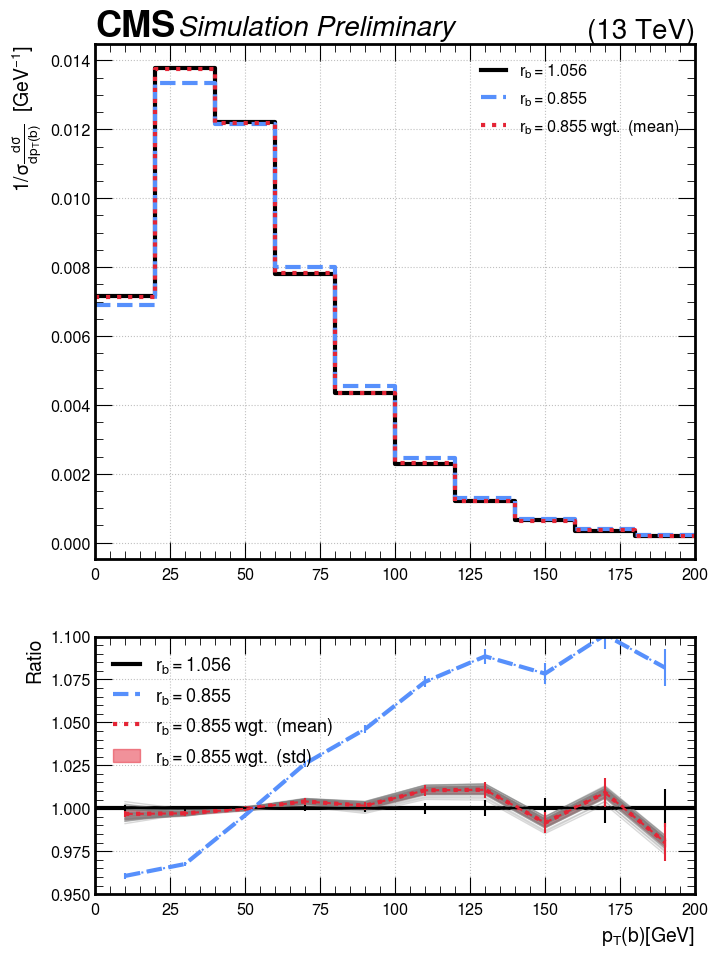

In [163]:
# plot the hists above

plot_bootstrapping_from_hists(out_hists, ratio_ylim=[0.95, 1.10], obs = r'p_{T}', part = 'b', unit = r' [GeV]', inv_unit = r' [GeV$^{-1}$]', save_folder = './plots', save_prefix = '10bins')


In [165]:
# org: pT 50 bins
'''
bins = np.linspace(0,200,51)

# calculate hist for each model (wgt in wgts_list)
hist_list, uncert_nrm_list = calc_hists_from_wgts_list(pT[0], bins, wgts_list_pT)

# get mean and std
mean_hist = np.mean(hist_list, axis = 0)
std_hist = np.std(hist_list, axis = 0)
# for uncertainty, only interested in mean per bin
mean_uncert = np.mean(uncert_nrm_list, axis = 0)


# calc other histograms to compare to
wgt_uni = np.ones_like(pT[0]) # need uniform wgts

[target_hist] , [target_uncert]  = calc_hists_from_wgts_list(pT[1], bins, [wgt_uni])
[nominal_hist], [nominal_uncert] = calc_hists_from_wgts_list(pT[0], bins, [wgt_uni])


# add last value to hist for plotting reasonscenter_mass_energy = '(13 TeV)'
target_hist     = np.concatenate((target_hist   , [target_hist[-1]]))
target_uncert   = np.concatenate((target_uncert , [target_uncert[-1]]))

nominal_hist    = np.concatenate((nominal_hist  , [nominal_hist[-1]]))
nominal_uncert  = np.concatenate((nominal_uncert, [nominal_uncert[-1]]))

mean_hist       = np.concatenate((mean_hist     , [mean_hist[-1]]))
mean_uncert     = np.concatenate((mean_uncert   , [mean_uncert[-1]]))
std_hist        = np.concatenate((std_hist      , [std_hist[-1]]))


# save all to disk for plotting macro
out_hists = [
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
]
out_hists = np.array(out_hists, dtype=object)
np.save('./plots/out_hists_b_pt_50bins.npy', out_hists)
'''

# load previously calculated hists from disk
out_hists = np.load('./plots/out_hists_b_pt_50bins.npy', allow_pickle=True)
[
    [hist_list, bins],
    [target_hist,  target_uncert ], 
    [nominal_hist, nominal_uncert],
    [mean_hist,    mean_uncert, std_hist]
] = out_hists


print('mean rwgt: hist, uncert, sdt')
print(mean_hist)
print(mean_uncert)
print(std_hist)

print('target: hist, uncert')
print(target_hist)
print(target_uncert)

print('nominal  : hist, uncert')
print(nominal_hist)
print(nominal_uncert)


mean rwgt: hist, uncert, sdt
[0.00214 0.00534 0.00759 0.00951 0.01115 0.01254 0.01354 0.01409 0.01438
 0.01423 0.01379 0.01308 0.01231 0.01137 0.01044 0.00948 0.00869 0.00779
 0.00696 0.00621 0.00549 0.00488 0.00428 0.00378 0.00333 0.00293 0.00259
 0.00228 0.00202 0.00174 0.00154 0.00135 0.00122 0.00104 0.00091 0.00083
 0.00071 0.00062 0.00056 0.0005  0.00045 0.00039 0.00035 0.00032 0.00028
 0.00025 0.00022 0.0002  0.00017 0.00015 0.00015]
[0.00795 0.00505 0.00424 0.0038  0.00352 0.00332 0.00319 0.00312 0.00309
 0.0031  0.00314 0.00321 0.00331 0.00343 0.00357 0.00374 0.0039  0.00411
 0.00434 0.00458 0.00486 0.00515 0.00549 0.00583 0.0062  0.00659 0.00701
 0.00746 0.00792 0.00851 0.00904 0.00967 0.01013 0.01094 0.0117  0.01222
 0.01327 0.01414 0.01488 0.01576 0.01662 0.0178  0.01888 0.01976 0.02106
 0.02211 0.02371 0.02468 0.02665 0.02819 0.02819]
[0.00001 0.00002 0.00003 0.00003 0.00002 0.00002 0.00002 0.00001 0.00001
 0.00001 0.00001 0.00001 0.00001 0.00001 0.00001 0.00001 0.00001 0.0

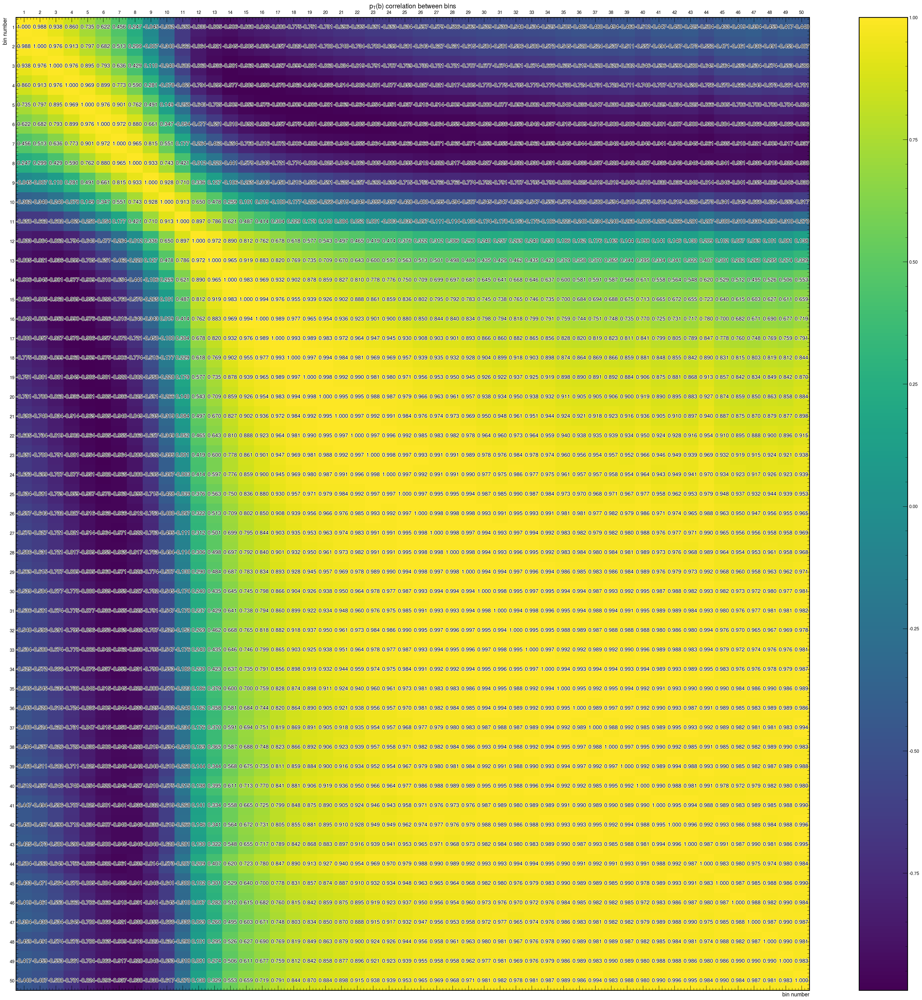

In [166]:
corr_matrix = weighted_corr(hist_list, weights = [1]*len(hist_list))

plot_matrix(corr_matrix, title = r'p$_{T}$(b) correlation between bins', savefig = './plots/pT_b_50bin_1M_50iter_corr_matrix.pdf')


/tmp/ipykernel_86812/2222998958.py:19: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


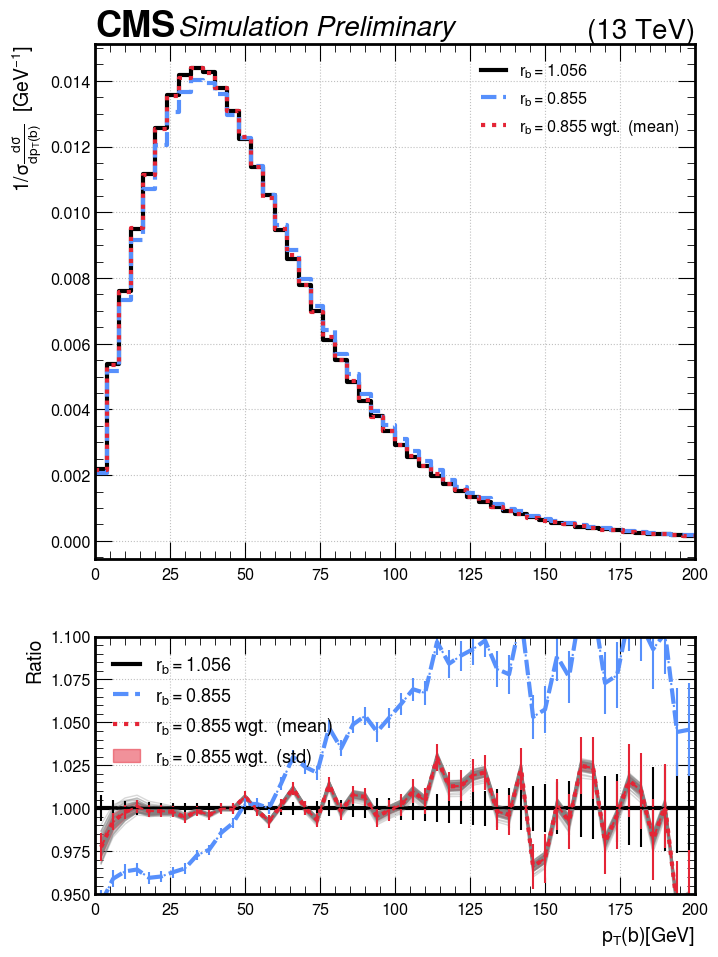

In [167]:
# plot the hists above

plot_bootstrapping_from_hists(out_hists, ratio_ylim=[0.95, 1.10], obs = r'p_{T}', part = 'b', unit = r' [GeV]', inv_unit = r' [GeV$^{-1}$]', save_folder = './plots', save_prefix = '50bins')


In [168]:
!jupyter nbconvert --to script Rb_bootstrapping_plotting_V3_with_uncert.ipynb


[NbConvertApp] Converting notebook Rb_bootstrapping_plotting_V3_with_uncert.ipynb to script
[NbConvertApp] Writing 26174 bytes to Rb_bootstrapping_plotting_V3_with_uncert.py
